SELEÇÃO DO ARQUIVO DE DADOS

In [2]:
from google.colab import files
uploaded = files.upload()

Saving dadosPlants13082022.json to dadosPlants13082022.json


IMPORTANDO OS DADOS

In [6]:
import pandas as pd
import json
file_name = "dadosPlants13082022.json"
uploaded[file_name].decode("utf-8")

'{\n  "readings1":[{\n  "timesTamp": "2022-8-5 05:00:02",\n    "co2SGP": "452",\n    "humBME": "66.5",\n    "pressBME": "1013.57",\n    "sgpTVOC": "417",\n    "tempBME": "30.38",\n    "tempSHT31": "3014",\n    "tlsLUX": "0"\n  },{\n  "timesTamp": "2022-8-5 05:00:04",\n    "co2SGP": "453",\n    "humBME": "66.1",\n    "pressBME": "1013.59",\n    "sgpTVOC": "410",\n    "tempBME": "30.61",\n    "tempSHT31": "3010",\n    "tlsLUX": "0"\n  },{\n  "timesTamp": "2022-8-5 05:00:05",\n    "co2SGP": "440",\n    "humBME": "66.2",\n    "pressBME": "1013.58",\n    "sgpTVOC": "393",\n    "tempBME": "30.47",\n    "tempSHT31": "3012",\n    "tlsLUX": "0"\n  },{\n  "timesTamp": "2022-8-5 05:00:07",\n    "co2SGP": "454",\n    "humBME": "66.2",\n    "pressBME": "1013.58",\n    "sgpTVOC": "400",\n    "tempBME": "30.40",\n    "tempSHT31": "3012",\n    "tlsLUX": "0"\n  },{\n  "timesTamp": "2022-8-5 05:00:09",\n    "co2SGP": "445",\n    "humBME": "66.3",\n    "pressBME": "1013.58",\n    "sgpTVOC": "391",\n    "

TRANSFORMANDO OS DADOS EM DATAFRAME

In [7]:
df = pd.read_json('dadosPlants13082022.json', orient='index')
df.head()

,0,1,2,3,4,5,6,7,8,9,...,64655,64656,64657,64658,64659,64660,64661,64662,64663,64664
readings1,"{'timesTamp': '2022-8-5 05:00:02', 'co2SGP': '...","{'timesTamp': '2022-8-5 05:00:04', 'co2SGP': '...","{'timesTamp': '2022-8-5 05:00:05', 'co2SGP': '...","{'timesTamp': '2022-8-5 05:00:07', 'co2SGP': '...","{'timesTamp': '2022-8-5 05:00:09', 'co2SGP': '...","{'timesTamp': '2022-8-5 05:00:15', 'co2SGP': '...","{'timesTamp': '2022-8-5 05:00:17', 'co2SGP': '...","{'timesTamp': '2022-8-5 05:00:19', 'co2SGP': '...","{'timesTamp': '2022-8-5 05:00:20', 'co2SGP': '...","{'timesTamp': '2022-8-5 05:00:22', 'co2SGP': '...",...,"{'timesTamp': '2022-8-7 04:59:35', 'co2SGP': '...","{'timesTamp': '2022-8-7 04:59:37', 'co2SGP': '...","{'timesTamp': '2022-8-7 04:59:39', 'co2SGP': '...","{'timesTamp': '2022-8-7 04:59:44', 'co2SGP': '...","{'timesTamp': '2022-8-7 04:59:46', 'co2SGP': '...","{'timesTamp': '2022-8-7 04:59:48', 'co2SGP': '...","{'timesTamp': '2022-8-7 04:59:49', 'co2SGP': '...","{'timesTamp': '2022-8-7 04:59:51', 'co2SGP': '...","{'timesTamp': '2022-8-7 04:59:57', 'co2SGP': '...","{'timesTamp': '2022-8-7 04:59:59', 'co2SGP': '..."


In [8]:
SUPERCOLUMN = 64665

TORNANDO O DATAFRAME EM ARRAY NUMPY

In [9]:
import numpy as np
arr = df.to_numpy()
print('\nNumpy Array\n----------\n', arr[0][0])
print('\nNumpy Array Datatype :', arr.dtype)


Numpy Array
----------
 {'timesTamp': '2022-8-5 05:00:02', 'co2SGP': '452', 'humBME': '66.5', 'pressBME': '1013.57', 'sgpTVOC': '417', 'tempBME': '30.38', 'tempSHT31': '3014', 'tlsLUX': '0'}

Numpy Array Datatype : object


TRANSFORMANDO O JSON EM ARRAYS

In [10]:
import json
from json import JSONEncoder
import numpy

class NumpyArrayEncoder(JSONEncoder):
    def default(self, obj):
        if isinstance(obj, numpy.ndarray):
            return obj.tolist()
        return JSONEncoder.default(self, obj)

numpyArrayOne = arr

# Serialization
numpyData = {"array": numpyArrayOne}
encodedNumpyData = json.dumps(numpyData, cls=NumpyArrayEncoder)  # use dump() to write array into file
print("Printing JSON serialized NumPy array")
print(encodedNumpyData)

# Deserialization
print("Decode JSON serialized NumPy array")
decodedArrays = json.loads(encodedNumpyData)

finalNumpyArray = numpy.asarray(decodedArrays["array"])
print("NumPy Array")
print(finalNumpyArray[0][5])



IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [11]:
def functionToGetDataFromArray(element):
  listData = []
  j = 0
  for n in finalNumpyArray[0]:
    numpyData3 = {"array": finalNumpyArray[0][j]}
    listData.append(numpyData3['array'][element])
    j = j+1
  numpyData2 = {"array": finalNumpyArray[0][0]}
  encodedNumpyData = json.dumps(numpyData2, cls=NumpyArrayEncoder)  # use dump() to write array into file
  print("Decode JSON serialized NumPy array")
  decodedArrays = json.loads(encodedNumpyData)
  return listData

In [12]:

timesTamp = functionToGetDataFromArray('timesTamp')
co2SGP = functionToGetDataFromArray('co2SGP')
humBME = functionToGetDataFromArray('humBME')
pressBME = functionToGetDataFromArray('pressBME')
sgpTVOC = functionToGetDataFromArray('sgpTVOC')
tempBME = functionToGetDataFromArray('tempBME')
tempSHT31 = functionToGetDataFromArray('tempSHT31')
tlsLUX = functionToGetDataFromArray('tlsLUX')
print(timesTamp)
print(co2SGP)
print(sgpTVOC)
print(humBME)
print(pressBME)
print(tempBME)
print(tempSHT31)
print(tlsLUX)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [13]:
print(timesTamp)
print(timesTamp[1][7], timesTamp[1][5])
number = ((int(timesTamp[0][9])*10 + int(timesTamp[0][10])) * 60) + (int(timesTamp[0][12])*10 + int(timesTamp[0][13]))
print(number)

['2022-8-5 05:00:02', '2022-8-5 05:00:04', '2022-8-5 05:00:05', '2022-8-5 05:00:07', '2022-8-5 05:00:09', '2022-8-5 05:00:15', '2022-8-5 05:00:17', '2022-8-5 05:00:19', '2022-8-5 05:00:20', '2022-8-5 05:00:22', '2022-8-5 05:00:28', '2022-8-5 05:00:30', '2022-8-5 05:00:31', '2022-8-5 05:00:33', '2022-8-5 05:00:35', '2022-8-5 05:00:41', '2022-8-5 05:00:42', '2022-8-5 05:00:44', '2022-8-5 05:00:46', '2022-8-5 05:00:48', '2022-8-5 05:00:53', '2022-8-5 05:00:55', '2022-8-5 05:00:57', '2022-8-5 05:00:59', '2022-8-5 05:01:01', '2022-8-5 05:01:06', '2022-8-5 05:01:08', '2022-8-5 05:01:10', '2022-8-5 05:01:12', '2022-8-5 05:01:14', '2022-8-5 05:01:19', '2022-8-5 05:01:20', '2022-8-5 05:01:22', '2022-8-5 05:01:24', '2022-8-5 05:01:26', '2022-8-5 05:01:31', '2022-8-5 05:01:35', '2022-8-5 05:01:37', '2022-8-5 05:01:39', '2022-8-5 05:01:41', '2022-8-5 05:01:46', '2022-8-5 05:01:48', '2022-8-5 05:01:50', '2022-8-5 05:01:52', '2022-8-5 05:01:53', '2022-8-5 05:01:59', '2022-8-5 05:02:01', '2022-8-5 05

In [14]:
print(timesTamp)
# print(timesTamp[1][9], timesTamp[1][10])
# number = ((int(timesTamp[0][9])*10 + int(timesTamp[0][10])) * 60) + (int(timesTamp[0][12])*10 + int(timesTamp[0][13]))
# print(number)
lines = 0
columns = 0
cincoHoras = 5
dezesseteHoras = 17
while columns < SUPERCOLUMN:
  #number = ((int(timesTamp[columns][9])*10 + int(timesTamp[columns][10])) * 60) + (int(timesTamp[columns][12])*10 + int(timesTamp[columns][13]))
  number = (int(timesTamp[columns][9])*10 + int(timesTamp[columns][10]))
  # if(int(timesTamp[columns][7]) == 7):
    # if(number > dezesseteHoras):
    #   print("stop line: ", columns)
  
  #print(timesTamp[columns])
  if(number >= cincoHoras):
    if(number <= dezesseteHoras):
      timesTamp[columns] = 'DIA'
    else:
      timesTamp[columns] = 'NOITE'
  else:
    timesTamp[columns] = 'NOITE'
  
  columns = columns + 1
  if(lines >= SUPERCOLUMN):
    break;


['2022-8-5 05:00:02', '2022-8-5 05:00:04', '2022-8-5 05:00:05', '2022-8-5 05:00:07', '2022-8-5 05:00:09', '2022-8-5 05:00:15', '2022-8-5 05:00:17', '2022-8-5 05:00:19', '2022-8-5 05:00:20', '2022-8-5 05:00:22', '2022-8-5 05:00:28', '2022-8-5 05:00:30', '2022-8-5 05:00:31', '2022-8-5 05:00:33', '2022-8-5 05:00:35', '2022-8-5 05:00:41', '2022-8-5 05:00:42', '2022-8-5 05:00:44', '2022-8-5 05:00:46', '2022-8-5 05:00:48', '2022-8-5 05:00:53', '2022-8-5 05:00:55', '2022-8-5 05:00:57', '2022-8-5 05:00:59', '2022-8-5 05:01:01', '2022-8-5 05:01:06', '2022-8-5 05:01:08', '2022-8-5 05:01:10', '2022-8-5 05:01:12', '2022-8-5 05:01:14', '2022-8-5 05:01:19', '2022-8-5 05:01:20', '2022-8-5 05:01:22', '2022-8-5 05:01:24', '2022-8-5 05:01:26', '2022-8-5 05:01:31', '2022-8-5 05:01:35', '2022-8-5 05:01:37', '2022-8-5 05:01:39', '2022-8-5 05:01:41', '2022-8-5 05:01:46', '2022-8-5 05:01:48', '2022-8-5 05:01:50', '2022-8-5 05:01:52', '2022-8-5 05:01:53', '2022-8-5 05:01:59', '2022-8-5 05:02:01', '2022-8-5 05

In [15]:


# lines = 0
# columns = 0
# cincoHoras = 5 * 60
# dezesseteHoras = 17 * 60
# while columns < SUPERCOLUMN:

#   if(timesTamp[columns] != 'DIA'):
#     if(timesTamp[columns] != 'NOITE'):
#       number = ((int(timesTamp[columns][9])*10 + int(timesTamp[columns][10])) * 60) 
#       if(number > 5):
#         if(number <17):
#           timesTamp[columns] = 'DIA'
#         elif(number == 17):
#           number = (int(timesTamp[columns][12])*10 + int(timesTamp[columns][13]))
#           if(number == 0):
#             timesTamp[columns] = 'DIA'
#           else:
#             timesTamp[columns] = 'NOITE'
#         else:
#           timesTamp[columns] = 'NOITE'
#       elif(number < 5):
#         timesTamp[columns] = 'NOITE'
#       else:
#         number = (int(timesTamp[columns][12])*10 + int(timesTamp[columns][13]))
#         if(number >= 0):
#           timesTamp[columns] = 'DIA'
#   columns = columns + 1
# print(timesTamp)

In [16]:
print(timesTamp)

['DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA', 'DIA'

In [17]:
# https://www.adamsmith.haus/python/answers/how-to-add-a-column-to-a-pandas-dataframe-from-a-list-in-python#:~:text=Use%20DataFrame%20indexing%20to%20add,element%20in%20list%20to%20pd.
# print do dataframe original
from numpy import random
data_array = random.randint(100, size=(SUPERCOLUMN, 4))
lines = 0
columns = 0
while(lines < SUPERCOLUMN):
    # data_array[lines][0] = timesTamp[lines]
    data_array[lines][0] = co2SGP[lines]
    data_array[lines][1] = sgpTVOC[lines]
    # data_array[lines][2] = int(float(pressBME[lines]))tlsLUX
    # data_array[lines][3] = int(float(tempBME[lines]))
    data_array[lines][2] = tlsLUX[lines]
    # data_array[lines][5] = int(float(humBME[lines]))
    data_array[lines][3] = tempSHT31[lines]
    lines = lines + 1
column_names = ["co2", "tvoc", "lux","temperatureSHT31"]
data_df = pd.DataFrame(data_array, columns=column_names)
data_df["temperatureBME"] = tempBME
data_df["humidity"] = humBME
data_df["pressure"] = pressBME
data_df["timesTamp"] = timesTamp
data_df.head(SUPERCOLUMN)

,co2,tvoc,lux,temperatureSHT31,temperatureBME,humidity,pressure,timesTamp
0,452,417,0,3014,30.38,66.5,1013.57,DIA
1,453,410,0,3010,30.61,66.1,1013.59,DIA
2,440,393,0,3012,30.47,66.2,1013.58,DIA
3,454,400,0,3012,30.40,66.2,1013.58,DIA
4,445,391,0,3012,30.36,66.3,1013.58,DIA
...,...,...,...,...,...,...,...,...
64660,493,512,0,2937,29.61,71.4,1014.20,NOITE
64661,497,519,0,2935,29.58,71.4,1014.20,NOITE
64662,500,527,0,2937,29.53,71.4,1014.20,NOITE
64663,506,529,0,2938,29.51,71.5,1014.21,NOITE


In [18]:
# https://www.adamsmith.haus/python/answers/how-to-add-a-column-to-a-pandas-dataframe-from-a-list-in-python#:~:text=Use%20DataFrame%20indexing%20to%20add,element%20in%20list%20to%20pd.
from numpy import random
data_array = random.randint(100, size=(SUPERCOLUMN, 7))
lines = 0
columns = 0
while(lines < SUPERCOLUMN):
    # data_array[lines][0] = timesTamp[lines]
    data_array[lines][0] = co2SGP[lines]
    data_array[lines][1] = sgpTVOC[lines]
    data_array[lines][2] = int(float(pressBME[lines]))
    data_array[lines][3] = int(float(tempBME[lines]))
    data_array[lines][4] = tlsLUX[lines]
    data_array[lines][5] = int(float(humBME[lines]))
    data_array[lines][6] = tempSHT31[lines]
    lines = lines + 1
column_names = ["co2", "tvoc","pressure","temperatureBME", "lux","humidity", "temperatureSHT31"]
data_df = pd.DataFrame(data_array, columns=column_names)
# data_df["temperatureBME"] = tempBME
#data_df["humidity"] = humBME
# data_df["pressure"] = pressBME
data_df["timesTamp"] = timesTamp
# lista = []
# lines = 0
# while(lines < SUPERCOLUMN):
#   lista.append(lines)
#   lines = lines + 1
# print(lista)
data_df.head(SUPERCOLUMN)

,co2,tvoc,pressure,temperatureBME,lux,humidity,temperatureSHT31,timesTamp
0,452,417,1013,30,0,66,3014,DIA
1,453,410,1013,30,0,66,3010,DIA
2,440,393,1013,30,0,66,3012,DIA
3,454,400,1013,30,0,66,3012,DIA
4,445,391,1013,30,0,66,3012,DIA
...,...,...,...,...,...,...,...,...
64660,493,512,1014,29,0,71,2937,NOITE
64661,497,519,1014,29,0,71,2935,NOITE
64662,500,527,1014,29,0,71,2937,NOITE
64663,506,529,1014,29,0,71,2938,NOITE


In [19]:
lista = []
lines = 0
while(lines < SUPERCOLUMN ):
  lista.append(lines)
  lines = lines + 1
data_df["index"] = lista
data_df.set_index('index')


,co2,tvoc,pressure,temperatureBME,lux,humidity,temperatureSHT31,timesTamp
index,,,,,,,,
0,452,417,1013,30,0,66,3014,DIA
1,453,410,1013,30,0,66,3010,DIA
2,440,393,1013,30,0,66,3012,DIA
3,454,400,1013,30,0,66,3012,DIA
4,445,391,1013,30,0,66,3012,DIA
...,...,...,...,...,...,...,...,...
64660,493,512,1014,29,0,71,2937,NOITE
64661,497,519,1014,29,0,71,2935,NOITE
64662,500,527,1014,29,0,71,2937,NOITE


CALCULO DA CORRELAÇÃO ENTRE OS PARÂMETROS:
https://medium.com/omixdata/estat%C3%ADstica-an%C3%A1lise-de-correla%C3%A7%C3%A3o-usando-python-e-r-d68611511b5a#:~:text=O%20coeficiente%20de%20Pearson%2C%20tamb%C3%A9m,valores%20entre%20%2D1%20e%201.

https://www.delftstack.com/pt/howto/python-pandas/pandas-correlation-matrix/

https://www.questionpro.com/blog/pt-br/correlacao-de-pearson/

https://queirozf.com/entries/pandas-dataframe-plot-examples-with-matplotlib-pyplot#scatter-plot-of-two-columns

Valor = -1 -> Correlação linear perfeita negativa
Valor = 1 -> Correlação linear perfeita positiva
Valor = 0 -> Auxência de relacionamento linear. Os parâmetros não mostram "alinhamento". Correlação **NULA**
-1 < Valor < 0 -> Correlação negativa (x sobe; y desce)
0 < Valor < 1 -> Correlação positiva (x sobe; y sobe)

Teoria sobre os testes de correlação:
http://www.mat.ufrgs.br/~viali/pg/material/laminaspime/CRS_6.pdf


In [20]:
#CALCULO DA MÉDIA E DA MEDIANA
print(data_df.describe())

                co2          tvoc      pressure  temperatureBME           lux  \
count  64665.000000  64665.000000  64665.000000    64665.000000  64665.000000   
mean     620.108853    938.893018   1013.832104       31.163628   1100.261594   
std      174.414984    796.550340      0.863469        1.221253   3750.733982   
min      400.000000    244.000000   1012.000000       28.000000      0.000000   
25%      557.000000    734.000000   1013.000000       30.000000      0.000000   
50%      605.000000    885.000000   1014.000000       31.000000    100.000000   
75%      661.000000   1034.000000   1015.000000       32.000000   1300.000000   
max    14950.000000  60000.000000   1015.000000       37.000000  65500.000000   

           humidity  temperatureSHT31         index  
count  64665.000000      64665.000000  64665.000000  
mean      63.667007       3140.281698  32332.000000  
std        3.510537        112.280013  18667.321916  
min       48.000000       2822.000000      0.000000  


Valores do coeficiente de correlação de Pearson: 
                       co2      tvoc  pressure  temperatureBME       lux  \
co2               1.000000  0.864213  0.199580        0.121055  0.063437   
tvoc              0.864213  1.000000  0.121856        0.177418  0.072054   
pressure          0.199580  0.121856  1.000000        0.115642  0.152125   
temperatureBME    0.121055  0.177418  0.115642        1.000000  0.408170   
lux               0.063437  0.072054  0.152125        0.408170  1.000000   
humidity         -0.148445 -0.178708 -0.102388       -0.882043 -0.434992   
temperatureSHT31  0.119700  0.173165  0.102816        0.957703  0.392860   
index            -0.140812 -0.071526 -0.094319       -0.001690  0.011497   

                  humidity  temperatureSHT31     index  
co2              -0.148445          0.119700 -0.140812  
tvoc             -0.178708          0.173165 -0.071526  
pressure         -0.102388          0.102816 -0.094319  
temperatureBME   -0.882043          0

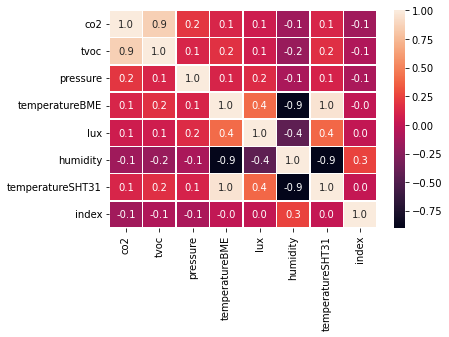

In [21]:
# Calculo da correlação entre os parâmetros
import seaborn as sn
correlation = data_df.corr(method='pearson')
print("Valores do coeficiente de correlação de Pearson: ")
print(correlation, "\n")
print("Pode-se perceber que a relação linear mais forte é entre co2 e tvoc.")
plot = sn.heatmap(correlation, annot = True, fmt=".1f", linewidths=.6)
plot

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

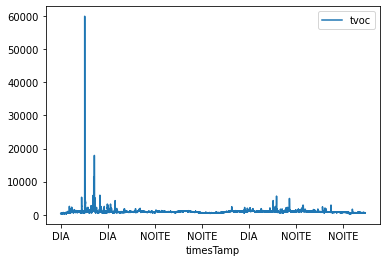

In [22]:
import matplotlib.pyplot as plt # Impot the relevant module
# fig, ax = plt.subplots() # Create the figure and axes object
# data_df.plot(x = 'timesTamp', y = 'tvoc', ax = ax) 
# data_df.plot(x = 'timesTamp', y = 'pressure', ax = ax, secondary_y = True) 

data_df.plot(x ='timesTamp', y='tvoc', kind = 'line')
# data_df.plot(x ='timesTamp', y='pressure', color = 'red', kind = 'line')
# plt.show()
plt.savefig("rawwp.eps")
files.download("rawwp.eps")

CICLO DIA NOITE

In [23]:
# lines = 0
# soma= 0
# idxNoite = 0
# qtdSomada = 0
# # while(lines < SUPERCOLUMN):
# #   if(timesTamp[lines] == 'NOITE'):
# #     break;
# #   lines += 1
# # print("lines1: ",lines)



# #lines = 0
# soma= 0
# soma2 = 0
# idxNoite = 0
# qtdSomada = 0
# while(lines < SUPERCOLUMN):
#   if(timesTamp[lines] == 'DIA'):
#     soma = soma + int(sgpTVOC[lines])
#     soma2 = soma2 + int(humBME[lines])
#     qtdSomada = qtdSomada + 1
#   elif(timesTamp[lines] == 'NOITE'):
#     idxNoite = lines
#     break
#   lines += 1
  
# print(soma)
# mediaDia1 = soma/qtdSomada
# media2Dia1 = soma2/qtdSomada
# print(mediaDia1)
# print(idxNoite)

# lines = idxNoite
# soma= 0
# soma2 = 0
# idxNoite = 0
# idxDia2 = 0
# qtdSomada = 0
# while(lines < SUPERCOLUMN):
#   if(timesTamp[lines] == 'DIA'):
#     soma = soma + int(sgpTVOC[lines])
#     soma2 = soma2 + int(humBME[lines])
#     qtdSomada = qtdSomada + 1
#   elif(timesTamp[lines] == 'NOITE'):
#       idxDia2 = lines
#       break
#   lines += 1
  
# print(soma)
# mediaDia2 = soma/qtdSomada
# media2Dia2 = soma2/qtdSomada
# print(mediaDia2)

# lines = idxDia2
# soma= 0
# soma2 = 0
# idxNoite = 0
# idxDia2 = 0
# qtdSomada = 0
# while(lines < SUPERCOLUMN):
#   if(timesTamp[lines] == 'DIA'):
#     soma = soma + int(sgpTVOC[lines])
#     soma2 = soma2 + int(humBME[lines])
#     qtdSomada = qtdSomada + 1
#   elif(timesTamp[lines] == 'NOITE'):
#       idxNoite = lines
#       break
#   lines += 1
  
# print(soma)
# mediaDia3 = soma/qtdSomada
# media2Dia3 = soma2/qtdSomada
# print(mediaDia3)

# lines = idxNoite
# soma= 0
# soma2 = 0
# idxNoite = 0
# idxDia2 = 0
# qtdSomada = 0
# while(lines < SUPERCOLUMN):
#   if(timesTamp[lines] == 'DIA'):
#     soma = soma + int(sgpTVOC[lines])
#     soma2 = soma2 + int(humBME[lines])
#     qtdSomada = qtdSomada + 1
#   elif(timesTamp[lines] == 'NOITE'):
#       idxDia2 = lines
#       break
#   lines += 1
  
# print(soma)
# mediaDia4 = soma/qtdSomada
# media2Dia4 = soma2/qtdSomada
# print(mediaDia4)

In [24]:
lines = 0
soma= 0
soma2 = 0
idxNoite = 0
qtdSomada = 0
# while(lines < 84635):
#   if(timesTamp[lines] == 'NOITE'):
#     break;
#   lines += 1
# print("lines1: ",lines)



#lines = 0
soma= 0
soma2 = 0
soma3 = 0
soma4 = 0
soma5 = 0
idxNoite = 0
qtdSomada = 0
while(lines < SUPERCOLUMN):
  if(timesTamp[lines] == 'DIA'):
    soma = soma + int(sgpTVOC[lines])
    soma2 = soma2 + float(humBME[lines])
    soma3 = soma3 + float(tempBME[lines])
    soma4 = soma4 + float(pressBME[lines])
    soma5 = soma5 + float(tlsLUX[lines])
    qtdSomada = qtdSomada + 1
  elif(timesTamp[lines] == 'NOITE'):
    idxNoite = lines
    break
  lines += 1
  
print(soma)
mediaDia1 = soma/qtdSomada
media2Dia1 = soma2/qtdSomada
media3Dia1 = soma3/qtdSomada
media4Dia1 = soma4/qtdSomada
media5Dia1 = soma5/qtdSomada
print(mediaDia1)
print(idxNoite)

lines = idxNoite
soma= 0
soma2= 0
soma3 = 0
soma4 = 0
soma5 = 0
idxNoite = 0
idxDia2 = 0
qtdSomada = 0
while(lines < SUPERCOLUMN):
  if(timesTamp[lines] == 'NOITE'):
    soma = soma + int(sgpTVOC[lines])
    soma2 = soma2 + float(humBME[lines])
    soma3 = soma3 + float(tempBME[lines])
    soma4 = soma4 + float(pressBME[lines])
    soma5 = soma5 + float(tlsLUX[lines])
    qtdSomada = qtdSomada + 1
  elif(timesTamp[lines] == 'DIA'):
      idxDia2 = lines
      break
  lines += 1
  
print(soma)
mediaDia2 = soma/qtdSomada
media2Dia2 = soma2/qtdSomada
media3Dia2 = soma3/qtdSomada
media4Dia2 = soma4/qtdSomada
media5Dia2 = soma5/qtdSomada
print(mediaDia2)

lines = idxDia2
soma= 0
soma2=0
soma3 = 0
soma4 = 0
soma5 = 0
idxNoite = 0
idxDia2 = 0
qtdSomada = 0
while(lines < SUPERCOLUMN):
  if(timesTamp[lines] == 'DIA'):
    soma = soma + int(sgpTVOC[lines])
    soma2 = soma2 + float(humBME[lines])
    soma3 = soma3 + float(tempBME[lines])
    soma4 = soma4 + float(pressBME[lines])
    soma5 = soma5 + float(tlsLUX[lines])
    qtdSomada = qtdSomada + 1
  elif(timesTamp[lines] == 'NOITE'):
      idxNoite = lines
      break
  lines += 1
  
print(soma)
mediaDia3 = soma/qtdSomada
media2Dia3 = soma2/qtdSomada
media3Dia3 = soma3/qtdSomada
media4Dia3 = soma4/qtdSomada
media5Dia3 = soma5/qtdSomada
print(mediaDia3)

lines = idxNoite
soma= 0
soma2 = 0
soma3 = 0
soma4 = 0
soma5 = 0
idxNoite = 0
idxDia2 = 0
qtdSomada = 0
while(lines < SUPERCOLUMN):#84635):
  if(timesTamp[lines] == 'NOITE'):
    soma = soma + int(sgpTVOC[lines])
    soma2 = soma2 + float(humBME[lines])
    soma3 = soma3 + float(tempBME[lines])
    soma4 = soma4 + float(pressBME[lines])
    soma5 = soma5 + float(tlsLUX[lines])
    qtdSomada = qtdSomada + 1
  elif(timesTamp[lines] == 'DIA'):
      idxDia2 = lines
      break
  lines += 1
  
print(soma)
mediaDia4 = soma/qtdSomada
media2Dia4 = soma2/qtdSomada
media3Dia4 = soma3/qtdSomada
media4Dia4 = soma4/qtdSomada
media5Dia4 = soma5/qtdSomada
print(mediaDia4)

18217121
1052.4044482957827
17310
12534682
832.4267499003852
17442276
995.3932545796953
12519438
847.3966427507784


In [25]:

# mediaDia1 = mediaDia1/mediaDia2#DIA
# mediaDia2 = mediaDia2/mediaDia2#DIA
# mediaDia3 = mediaDia3/mediaDia2#NOITE
# mediaDia4 = mediaDia4/mediaDia2#DIA

# media2Dia1 = media2Dia1/media2Dia2
# media2Dia2 = media2Dia2/media2Dia2
# media2Dia3 = media2Dia3/media2Dia2
# media2Dia4 = media2Dia4/media2Dia2

# media3Dia1 = media3Dia1/media3Dia2
# media3Dia2 = media3Dia2/media3Dia2
# media3Dia3 = media3Dia3/media3Dia2
# media3Dia4 = media3Dia4/media3Dia2

# media4Dia1 = media4Dia1/media4Dia2
# media4Dia2 = media4Dia2/media4Dia2
# media4Dia3 = media4Dia3/media4Dia2
# media4Dia4 = media4Dia4/media4Dia2

# media5Dia1 = media5Dia1/media5Dia2
# media5Dia2 = media5Dia2/media5Dia2
# media5Dia3 = media5Dia3/media5Dia2
# media5Dia4 = media5Dia4/media5Dia2

In [26]:
data_array = np. empty((4, 5), float)
print("DAY: ",mediaDia1)
print("NIGHT: ",mediaDia2)
print("DAY: ",mediaDia3)
print("NIGHT: ",mediaDia4)

# empty_array[0][0] = mediaDia4/mediaDia2
# print("data_array[3][0]: ",mediaDia4/mediaDia2)

DAY:  1052.4044482957827
NIGHT:  832.4267499003852
DAY:  995.3932545796953
NIGHT:  847.3966427507784


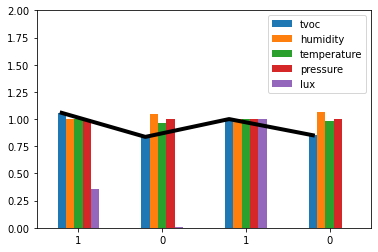

In [27]:
data_array[0][0] = mediaDia1/mediaDia3#vocs
data_array[1][0] = mediaDia2/mediaDia3
data_array[2][0] = mediaDia3/mediaDia3
data_array[3][0] = mediaDia4/mediaDia3

data_array[0][1] = media2Dia1/media2Dia3
data_array[1][1] = media2Dia2/media2Dia3
data_array[2][1] = media2Dia3/media2Dia3
data_array[3][1] = media2Dia4/media2Dia3

data_array[0][2] = media3Dia1/media3Dia3
data_array[1][2] = media3Dia2/media3Dia3
data_array[2][2] = media3Dia3/media3Dia3
data_array[3][2] = media3Dia4/media3Dia3

data_array[0][3] = media4Dia1/media4Dia3
data_array[1][3] = media4Dia2/media4Dia3
data_array[2][3] = media4Dia3/media4Dia3
data_array[3][3] = media4Dia4/media4Dia3

data_array[0][4] = media5Dia1/media5Dia3
data_array[1][4] = media5Dia2/media5Dia3
data_array[2][4] = media5Dia3/media5Dia3
data_array[3][4] = media5Dia4/media5Dia3
column_names = ["tvoc","humidity","temperature", "pressure", "lux"]
data_df = pd.DataFrame(data_array, columns=column_names)
lista = [1, 0,1,0]
data_df[""] = lista
data_df.head(4)
# data_df.plot.bar(x ='timesTamp', y='tvoc', rot = 0)
# data_df.plot.bar(x ='timesTamp', y='hum', rot = 0)
# data_df.plot.bar(x ='timesTamp', y='temp', rot = 0)
ax = data_df.plot.bar(x = '', rot=0)
y1 = mediaDia1/mediaDia3
y2 = mediaDia2/mediaDia3
y3 = mediaDia3/mediaDia3
y4 = mediaDia4/mediaDia3
yv = [y1, y2, y3, y4]
xv = [-0.2, 0.8, 1.8, 2.8]
plt.plot(xv,yv,color='black',linewidth=4)
plt.ylim((0,2))
plt.legend(loc='upper right')
#Baixar o gráfico em formato ".eps"
#plt.savefig("figWPlant.eps")
#files.download("figWPlant.eps")

,tvoc,humidity,temperature,pressure,lux,
0,1.000000,0.939687,0.997403,0.999788,0.353284,1.0
1,0.790976,0.982503,0.965902,0.999874,0.003989,0.0
2,0.945828,0.935438,1.000000,1.000000,1.000000,1.0
3,0.805201,1.000000,0.982642,0.999850,0.000354,0.0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

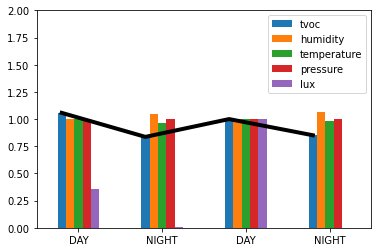

In [28]:
df_max_scaled = data_df.copy() 
for column in df_max_scaled.columns: 
    df_max_scaled[column] = df_max_scaled[column]  / df_max_scaled[column].abs().max() 
      
display(df_max_scaled)
lista = ["DAY", "NIGHT","DAY","NIGHT"]
data_df[""] = lista
ax = data_df.plot.bar(x = '', rot=0)
plt.plot(xv,yv,color='black',linewidth=4)
plt.ylim((0,2))
plt.legend(loc='upper right')
#Baixar o gráfico em formato ".eps"
plt.savefig("figPlant.eps")
files.download("figPlant.eps")